## Experiments to determine source of weird line at $\theta=0$

### Experiment 1: Rotating Wright Lab data 90º

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy.interpolate import RectBivariateSpline
from scipy.interpolate import interp2d
import datetime
from unwrap import unwrap
from scipy.interpolate import griddata
from NF2FF import *

In [48]:
EWpol_NF_data = np.load('/hirax/20220916_WLC_NFandFF/NF_Map_220916_EWPol.npz',allow_pickle=True)
EWpol_NF_data.files

['t',
 'x',
 'y',
 'z',
 'V',
 'V_bgsub',
 'V_bg',
 'V_cross',
 'V_cross_bgsub',
 'V_cross_bg',
 'i_on',
 'f']

In [49]:
EWpol_NF_amplitude = np.sqrt(EWpol_NF_data['V_bgsub'])
EWpol_NF_phase = np.angle(EWpol_NF_data['V_cross_bgsub'])

EWpol_NF_complex = EWpol_NF_amplitude[:,:,1]*np.cos(EWpol_NF_phase[:,:,0]) + 1j*EWpol_NF_amplitude[:,:,1]*np.sin(EWpol_NF_phase[:,:,0])

<ipython-input-49-d902c576fc04>:1: RuntimeWarning: invalid value encountered in sqrt
  EWpol_NF_amplitude = np.sqrt(EWpol_NF_data['V_bgsub'])


(42368,)


Text(0, 0.5, 'y position')

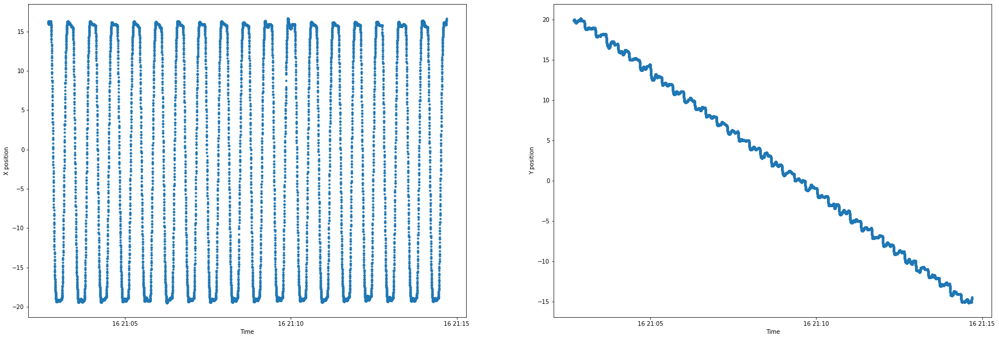

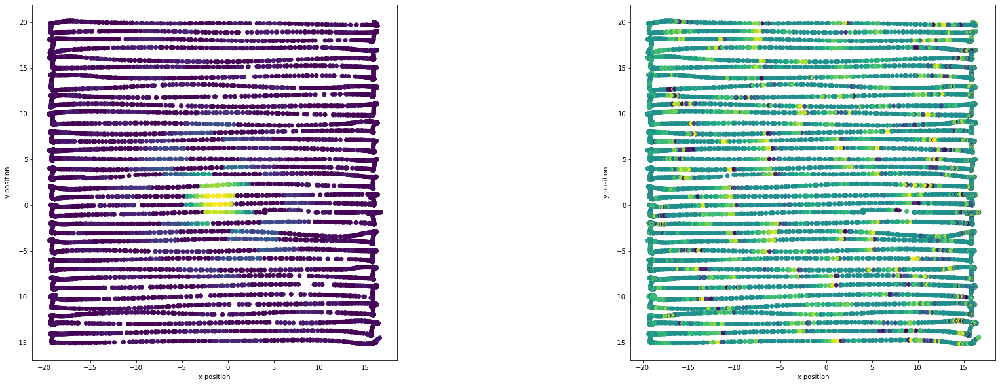

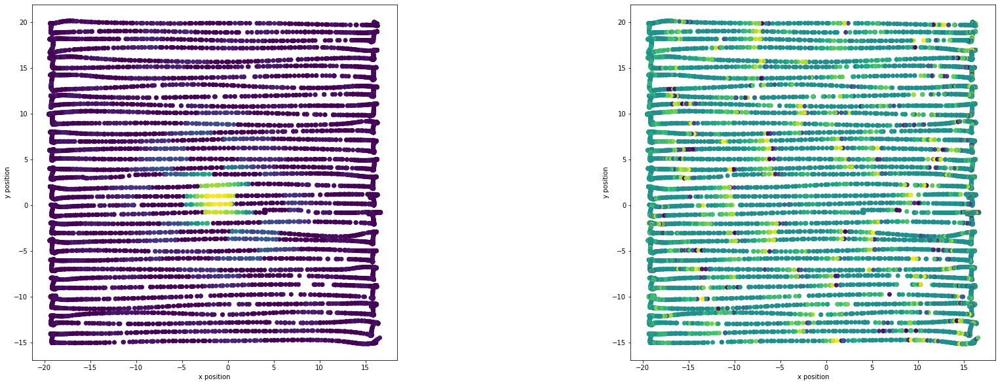

In [50]:
# plotting x and y position over time
print(EWpol_NF_data['t'].shape)

fig,ax = plt.subplots(1,2,figsize=(30,10))
ax[0].plot((EWpol_NF_data['t'])[13150:30310],(EWpol_NF_data['x'])[13150:30310],'.')
ax[0].set_xlabel('Time')
ax[0].set_ylabel('X position')
ax[1].plot((EWpol_NF_data['t'])[13150:30310],(EWpol_NF_data['y'])[13150:30310],'.')
ax[1].set_xlabel('Time')
ax[1].set_ylabel('Y position')

fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(1,2,1)
ax.scatter((EWpol_NF_data['x'])[13150:30310],(EWpol_NF_data['y'])[13150:30310],c=(EWpol_NF_amplitude[13150:30310,275,1]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')
ax = fig.add_subplot(1,2,2)
ax.scatter((EWpol_NF_data['x'])[13150:30310],(EWpol_NF_data['y'])[13150:30310],c=EWpol_NF_phase[13150:30310,275])
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')

fig=plt.figure(figsize=(30,10))
ax = fig.add_subplot(1,2,1)
ax.scatter((EWpol_NF_data['x'])[13150:30310],(EWpol_NF_data['y'])[13150:30310],c=(np.abs(EWpol_NF_complex[13150:30310,275])))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')
ax = fig.add_subplot(1,2,2)
ax.scatter((EWpol_NF_data['x'])[13150:30310],(EWpol_NF_data['y'])[13150:30310],c=np.angle(EWpol_NF_complex[13150:30310,275]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')

Text(0, 0.5, 'y position')

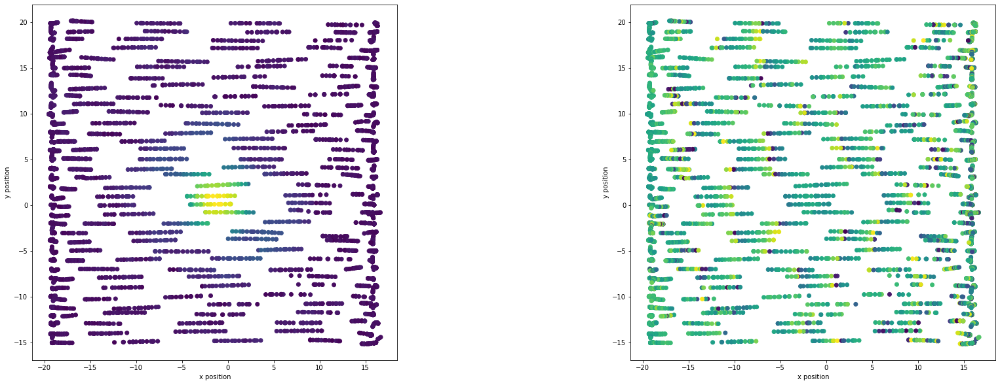

In [51]:
EWpol_NF_complex_grid = EWpol_NF_complex[13150:30310,:]
EWpol_t_grid = (EWpol_NF_data['t'])[13150:30310]
EWpol_x_grid = (EWpol_NF_data['x'])[13150:30310]
EWpol_y_grid = (EWpol_NF_data['y'])[13150:30310]
EWpol_z_grid = (EWpol_NF_data['z'])[13150:30310]

EWpol_i_on = EWpol_NF_data['i_on']
EWpol_grid_i_on=[]
for ind in EWpol_i_on:
    if (ind >= 13150) & (ind <= 30310):
        EWpol_grid_i_on.append(ind)

EWpol_NF_complex_grid_selected = EWpol_NF_complex[EWpol_grid_i_on]
EWpol_t_grid_selected = (EWpol_NF_data['t'])[EWpol_grid_i_on]
EWpol_x_grid_selected = (EWpol_NF_data['x'])[EWpol_grid_i_on]
EWpol_y_grid_selected = (EWpol_NF_data['y'])[EWpol_grid_i_on]
EWpol_z_grid_selected = (EWpol_NF_data['z'])[EWpol_grid_i_on]

fig=plt.figure(figsize=(30,10))
ax = fig.add_subplot(1,2,1)
ax.scatter(EWpol_x_grid_selected,EWpol_y_grid_selected,c=np.abs(EWpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')
ax = fig.add_subplot(1,2,2)
ax.scatter(EWpol_x_grid_selected,EWpol_y_grid_selected,c=np.angle(EWpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')

In [52]:
nyquist_m = NyquistSampling((EWpol_NF_data['f'])[275]*(10**6))
M = int(np.ceil(30/nyquist_m))
N = M

print(nyquist_m)
print(M)

M = 200
N = M

0.2164322313818387
139


In [53]:
# interpolating to Nyquist spacing

EWpol_NF_real_grid = np.nan_to_num(EWpol_NF_complex_grid.real)
EWpol_NF_im_grid = np.nan_to_num(EWpol_NF_complex_grid.imag)

EWpol_NF_real_grid_selected = np.nan_to_num(EWpol_NF_complex_grid_selected.real)
EWpol_NF_im_grid_selected = np.nan_to_num(EWpol_NF_complex_grid_selected.imag)

x_interp = np.linspace(-15,15,M)
y_interp = np.linspace(-15,15,M)

[x_interp_grid,y_interp_grid]=np.meshgrid(x_interp,y_interp)

EWpol_NF_real_interp = griddata((EWpol_x_grid,EWpol_y_grid),EWpol_NF_real_grid[:,275],(x_interp_grid,y_interp_grid))
EWpol_NF_im_interp = griddata((EWpol_x_grid,EWpol_y_grid),EWpol_NF_im_grid[:,275],(x_interp_grid,y_interp_grid))

EWpol_NF_real_interp_selected = griddata((EWpol_x_grid_selected,EWpol_y_grid_selected),EWpol_NF_real_grid_selected[:,275],(x_interp_grid,y_interp_grid))
EWpol_NF_im_interp_selected = griddata((EWpol_x_grid_selected,EWpol_y_grid_selected),EWpol_NF_im_grid_selected[:,275],(x_interp_grid,y_interp_grid))

In [54]:
EWpol_NF_interped = EWpol_NF_real_interp + 1j*EWpol_NF_im_interp
EWpol_NF_interped_amplitude = np.abs(EWpol_NF_interped)
EWpol_NF_interped_phase = np.angle(EWpol_NF_interped)

EWpol_NF_interped_selected = EWpol_NF_real_interp_selected + 1j*EWpol_NF_im_interp_selected
EWpol_NF_interped_amplitude_selected = np.abs(EWpol_NF_interped_selected)
EWpol_NF_interped_phase_selected = np.angle(EWpol_NF_interped_selected)

# flipping the interpolated indices on ("selected" grid)
EWpol_NF_interped_flipped = np.transpose(EWpol_NF_interped_selected)
EWpol_NF_interped_flipped_amplitude = np.abs(EWpol_NF_interped_flipped)
EWpol_NF_interped_flipped_phase = np.angle(EWpol_NF_interped_flipped)

<ipython-input-55-334ff382ec47>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_amplitude)
<ipython-input-55-334ff382ec47>:18: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_phase)
<ipython-input-55-334ff382ec47>:29: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either spec

Text(0.5, 1.0, 'Flipped interpolated NF data: Phase')

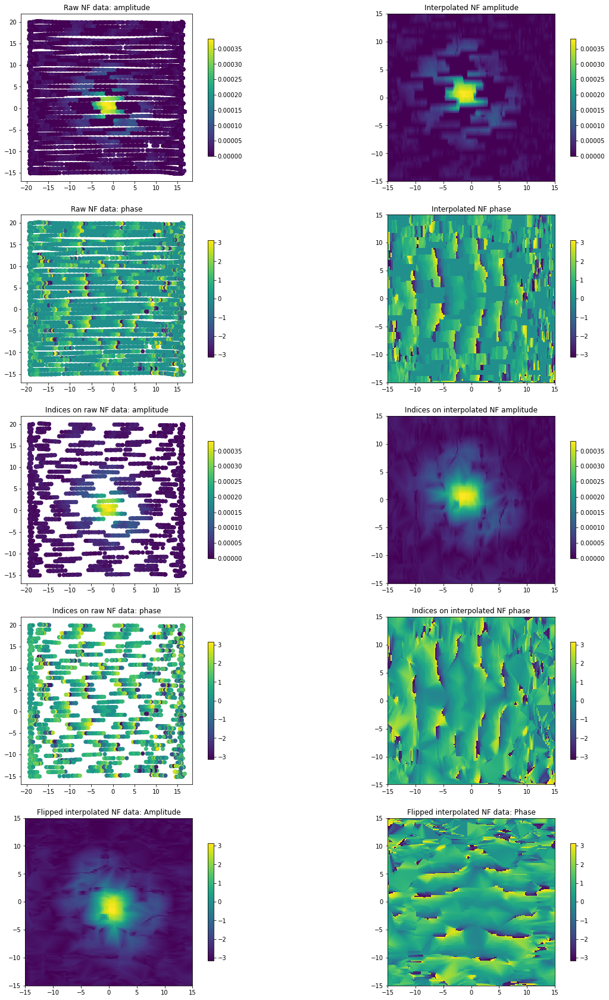

In [55]:
fig = plt.figure(figsize=(20,30))
ax = fig.add_subplot(5,2,1)
plt.scatter(EWpol_x_grid,EWpol_y_grid,c=np.abs(EWpol_NF_complex_grid[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Raw NF data: amplitude')
ax = fig.add_subplot(5,2,2)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_amplitude)
plt.title('Interpolated NF amplitude')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')
ax = fig.add_subplot(5,2,3)
plt.scatter(EWpol_x_grid,EWpol_y_grid,c=np.angle(EWpol_NF_complex_grid[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Raw NF data: phase')
ax = fig.add_subplot(5,2,4)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_phase)
plt.title('Interpolated NF phase')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')

ax = fig.add_subplot(5,2,5)
plt.scatter(EWpol_x_grid_selected,EWpol_y_grid_selected,c=np.abs(EWpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Indices on raw NF data: amplitude')
ax = fig.add_subplot(5,2,6)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_amplitude_selected)
plt.title('Indices on interpolated NF amplitude')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')
ax = fig.add_subplot(5,2,7)
plt.scatter(EWpol_x_grid_selected,EWpol_y_grid_selected,c=np.angle(EWpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Indices on raw NF data: phase')
ax = fig.add_subplot(5,2,8)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_phase_selected)
plt.title('Indices on interpolated NF phase')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')

ax=fig.add_subplot(5,2,9)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_flipped_amplitude)
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Flipped interpolated NF data: Amplitude')
ax=fig.add_subplot(5,2,10)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_flipped_phase)
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Flipped interpolated NF data: Phase')

In [56]:
# bringing in NS pol

NSpol_NF_data = np.load('/hirax/20220916_WLC_NFandFF/NF_Map_220916_NSPol.npz',allow_pickle=True)
NSpol_NF_data.files

['t',
 'x',
 'y',
 'z',
 'V',
 'V_bgsub',
 'V_bg',
 'V_cross',
 'V_cross_bgsub',
 'V_cross_bg',
 'i_on',
 'f']

In [57]:
NSpol_NF_amplitude = np.sqrt(NSpol_NF_data['V_bgsub'])
NSpol_NF_phase = np.angle(NSpol_NF_data['V_cross_bgsub'])

NSpol_NF_complex = NSpol_NF_amplitude[:,:,1]*np.cos(NSpol_NF_phase[:,:,0]) + 1j*NSpol_NF_amplitude[:,:,1]*np.sin(NSpol_NF_phase[:,:,0])

<ipython-input-57-5d4099d53086>:1: RuntimeWarning: invalid value encountered in sqrt
  NSpol_NF_amplitude = np.sqrt(NSpol_NF_data['V_bgsub'])


(48576,)


Text(0, 0.5, 'y position')

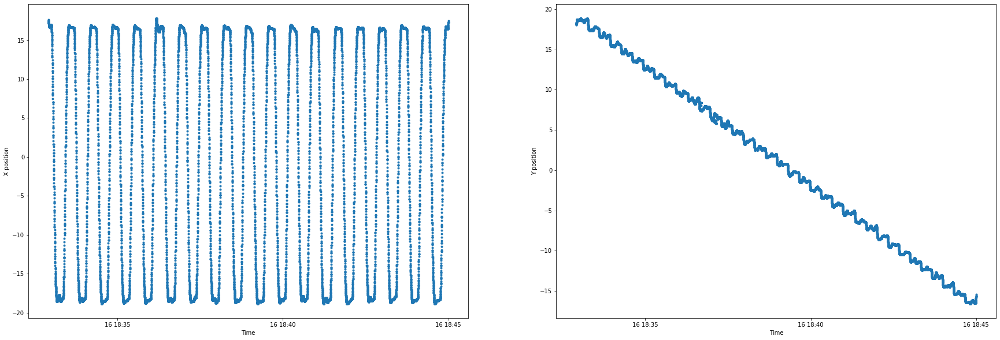

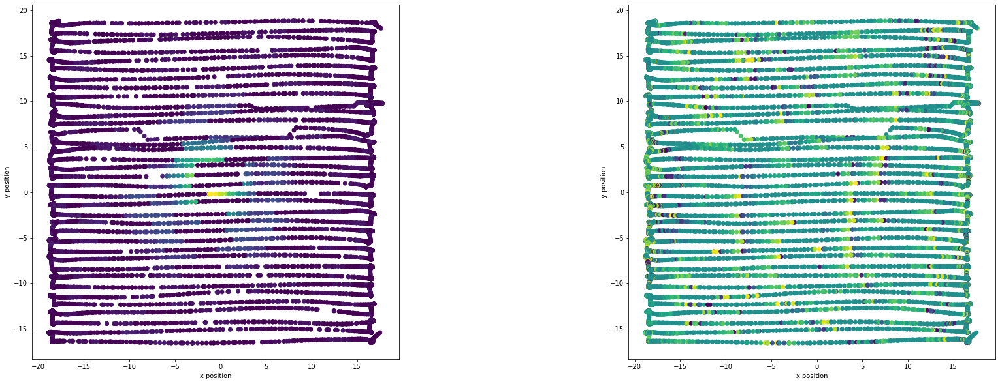

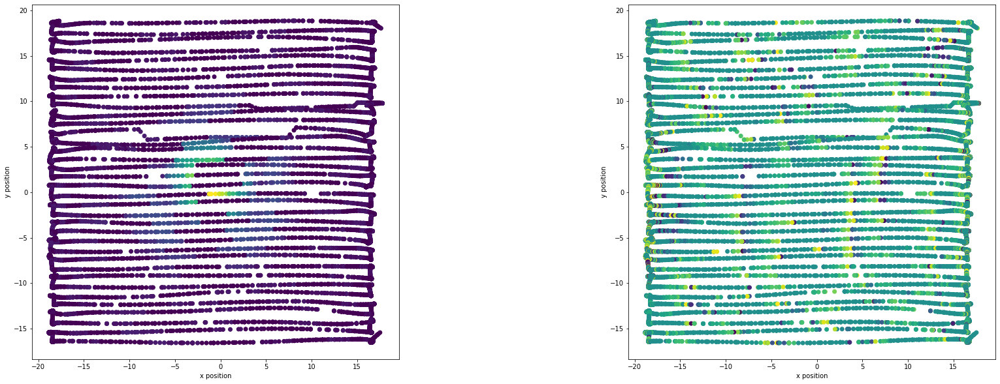

In [58]:
# plotting x and y position over time
print(NSpol_NF_data['t'].shape)

fig,ax = plt.subplots(1,2,figsize=(30,10))
ax[0].plot((NSpol_NF_data['t'])[19450:36740],(NSpol_NF_data['x'])[19450:36740],'.')
ax[0].set_xlabel('Time')
ax[0].set_ylabel('X position')
ax[1].plot((NSpol_NF_data['t'])[19450:36740],(NSpol_NF_data['y'])[19450:36740],'.')
ax[1].set_xlabel('Time')
ax[1].set_ylabel('Y position')

fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(1,2,1)
ax.scatter((NSpol_NF_data['x'])[19450:36740],(NSpol_NF_data['y'])[19450:36740],c=(NSpol_NF_amplitude[19450:36740,275,1]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')
ax = fig.add_subplot(1,2,2)
ax.scatter((NSpol_NF_data['x'])[19450:36740],(NSpol_NF_data['y'])[19450:36740],c=NSpol_NF_phase[19450:36740,275])
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')

fig=plt.figure(figsize=(30,10))
ax = fig.add_subplot(1,2,1)
ax.scatter((NSpol_NF_data['x'])[19450:36740],(NSpol_NF_data['y'])[19450:36740],c=(np.abs(NSpol_NF_complex[19450:36740,275])))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')
ax = fig.add_subplot(1,2,2)
ax.scatter((NSpol_NF_data['x'])[19450:36740],(NSpol_NF_data['y'])[19450:36740],c=np.angle(NSpol_NF_complex[19450:36740,275]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')

Text(0, 0.5, 'y position')

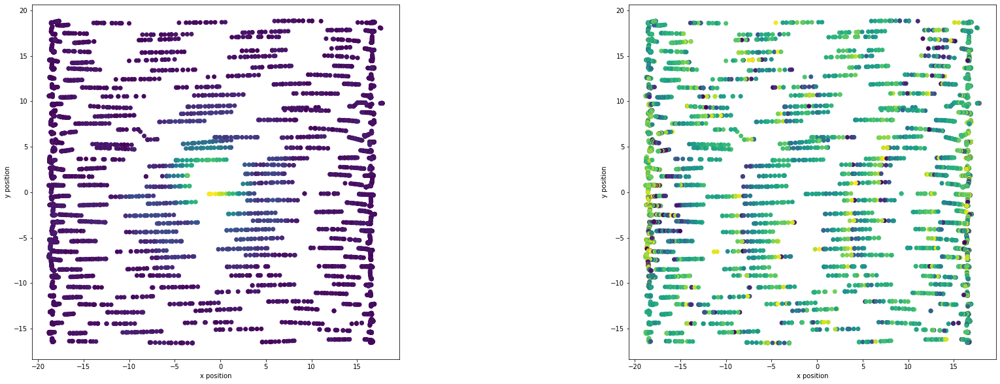

In [59]:
NSpol_NF_complex_grid = NSpol_NF_complex[19450:36740,:]
NSpol_t_grid = (NSpol_NF_data['t'])[19450:36740]
NSpol_x_grid = (NSpol_NF_data['x'])[19450:36740]
NSpol_y_grid = (NSpol_NF_data['y'])[19450:36740]
NSpol_z_grid = (NSpol_NF_data['z'])[19450:36740]

NSpol_i_on = NSpol_NF_data['i_on']
NSpol_grid_i_on=[]
for ind in NSpol_i_on:
    if (ind >= 19450) & (ind <= 36740):
        NSpol_grid_i_on.append(ind)

NSpol_NF_complex_grid_selected = NSpol_NF_complex[NSpol_grid_i_on]
NSpol_t_grid_selected = (NSpol_NF_data['t'])[NSpol_grid_i_on]
NSpol_x_grid_selected = (NSpol_NF_data['x'])[NSpol_grid_i_on]
NSpol_y_grid_selected = (NSpol_NF_data['y'])[NSpol_grid_i_on]
NSpol_z_grid_selected = (NSpol_NF_data['z'])[NSpol_grid_i_on]

fig=plt.figure(figsize=(30,10))
ax = fig.add_subplot(1,2,1)
ax.scatter(NSpol_x_grid_selected,NSpol_y_grid_selected,c=np.abs(NSpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')
ax = fig.add_subplot(1,2,2)
ax.scatter(NSpol_x_grid_selected,NSpol_y_grid_selected,c=np.angle(NSpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
ax.set_xlabel('x position')
ax.set_ylabel('y position')

In [60]:
# interpolate data to Nyquist spacing

NSpol_NF_real_grid = np.nan_to_num(NSpol_NF_complex_grid.real)
NSpol_NF_im_grid = np.nan_to_num(NSpol_NF_complex_grid.imag)

NSpol_NF_real_grid_selected = np.nan_to_num(NSpol_NF_complex_grid_selected.real)
NSpol_NF_im_grid_selected = np.nan_to_num(NSpol_NF_complex_grid_selected.imag)

x_interp = np.linspace(-15,15,M)
y_interp = np.linspace(-15,15,M)

[x_interp_grid,y_interp_grid]=np.meshgrid(x_interp,y_interp)

NSpol_NF_real_interp = griddata((NSpol_x_grid,NSpol_y_grid),NSpol_NF_real_grid[:,275],(x_interp_grid,y_interp_grid))
NSpol_NF_im_interp = griddata((NSpol_x_grid,NSpol_y_grid),NSpol_NF_im_grid[:,275],(x_interp_grid,y_interp_grid))

NSpol_NF_real_interp_selected = griddata((NSpol_x_grid_selected,NSpol_y_grid_selected),NSpol_NF_real_grid_selected[:,275],(x_interp_grid,y_interp_grid))
NSpol_NF_im_interp_selected = griddata((NSpol_x_grid_selected,NSpol_y_grid_selected),NSpol_NF_im_grid_selected[:,275],(x_interp_grid,y_interp_grid))

In [61]:
NSpol_NF_interped = NSpol_NF_real_interp + 1j*NSpol_NF_im_interp
NSpol_NF_interped_amplitude = np.abs(NSpol_NF_interped)
NSpol_NF_interped_phase = np.angle(NSpol_NF_interped)

NSpol_NF_interped_selected = NSpol_NF_real_interp_selected + 1j*NSpol_NF_im_interp_selected
NSpol_NF_interped_amplitude_selected = np.abs(NSpol_NF_interped_selected)
NSpol_NF_interped_phase_selected = np.angle(NSpol_NF_interped_selected)

# flipping the interpolated indices on ("selected" grid)
NSpol_NF_interped_flipped = np.transpose(NSpol_NF_interped_selected)
NSpol_NF_interped_flipped_amplitude = np.abs(NSpol_NF_interped_flipped)
NSpol_NF_interped_flipped_phase = np.angle(NSpol_NF_interped_flipped)

<ipython-input-62-71497bb01619>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_interp_grid,y_interp_grid,NSpol_NF_interped_amplitude)
<ipython-input-62-71497bb01619>:18: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_interp_grid,y_interp_grid,NSpol_NF_interped_phase)
<ipython-input-62-71497bb01619>:30: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either spec

Text(0.5, 1.0, 'Flipped interpolated NF data: Phase')

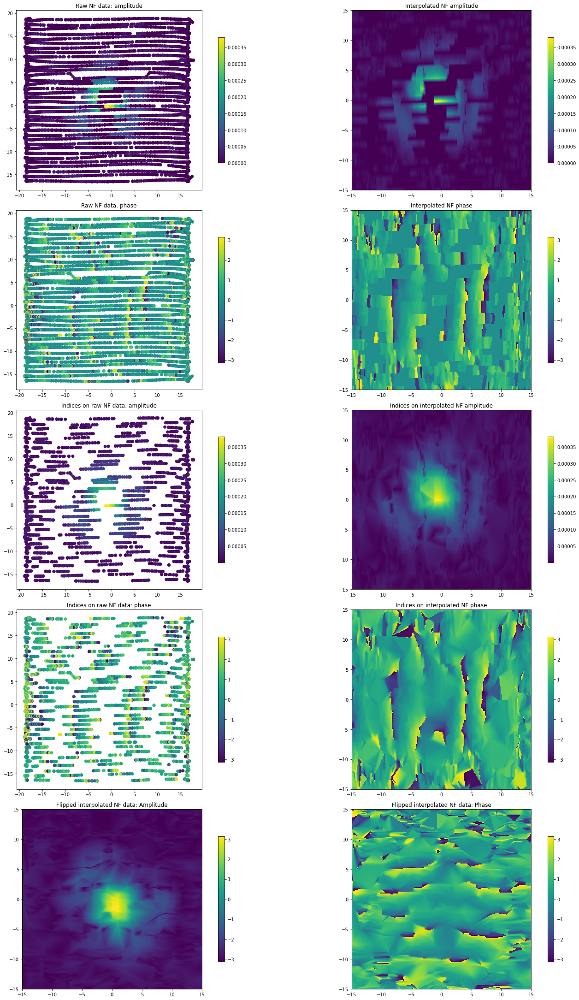

In [62]:
fig = plt.figure(figsize=(20,30))
ax = fig.add_subplot(5,2,1)
plt.scatter(NSpol_x_grid,NSpol_y_grid,c=np.abs(NSpol_NF_complex_grid[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Raw NF data: amplitude')
ax = fig.add_subplot(5,2,2)
ax.pcolormesh(x_interp_grid,y_interp_grid,NSpol_NF_interped_amplitude)
plt.title('Interpolated NF amplitude')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')
ax = fig.add_subplot(5,2,3)
plt.scatter(NSpol_x_grid,NSpol_y_grid,c=np.angle(NSpol_NF_complex_grid[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Raw NF data: phase')
ax = fig.add_subplot(5,2,4)
ax.pcolormesh(x_interp_grid,y_interp_grid,NSpol_NF_interped_phase)
plt.title('Interpolated NF phase')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')
plt.tight_layout()

ax = fig.add_subplot(5,2,5)
plt.scatter(NSpol_x_grid_selected,NSpol_y_grid_selected,c=np.abs(NSpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Indices on raw NF data: amplitude')
ax = fig.add_subplot(5,2,6)
ax.pcolormesh(x_interp_grid,y_interp_grid,NSpol_NF_interped_amplitude_selected)
plt.title('Indices on interpolated NF amplitude')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')
ax = fig.add_subplot(5,2,7)
plt.scatter(NSpol_x_grid_selected,NSpol_y_grid_selected,c=np.angle(NSpol_NF_complex_grid_selected[:,275]))
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Indices on raw NF data: phase')
ax = fig.add_subplot(5,2,8)
ax.pcolormesh(x_interp_grid,y_interp_grid,NSpol_NF_interped_phase_selected)
plt.title('Indices on interpolated NF phase')
plt.colorbar(shrink=0.7)
ax.set_aspect('equal')
plt.tight_layout()

ax=fig.add_subplot(5,2,9)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_flipped_amplitude)
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Flipped interpolated NF data: Amplitude')
ax=fig.add_subplot(5,2,10)
ax.pcolormesh(x_interp_grid,y_interp_grid,EWpol_NF_interped_flipped_phase)
ax.set_aspect('equal')
plt.colorbar(shrink=0.7)
plt.title('Flipped interpolated NF data: Phase')

In [63]:
[m,n,k_X_Rectangular,k_Y_Rectangular,theta,phi]=RegularGridding(x_interp,y_interp,0.01,0.01)
k0 = Calculate_k0((EWpol_NF_data['f'])[275]*(10**6))

<ipython-input-64-c5c7e7b3ce8f>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax[0].pcolormesh(x_interp,y_interp,np.abs(NF_X_Complex))
<ipython-input-64-c5c7e7b3ce8f>:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax[1].pcolormesh(x_interp,y_interp,np.abs(NF_Y_Complex))


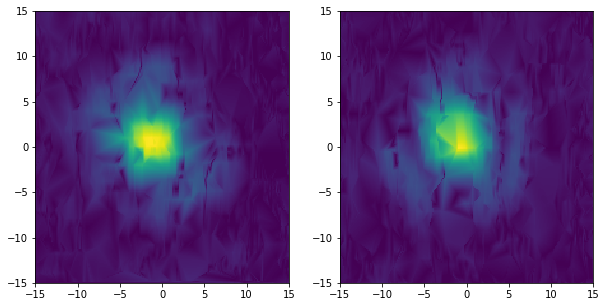

In [64]:
NF_X_Complex = EWpol_NF_interped_selected
NF_Y_Complex = NSpol_NF_interped_selected

NF_X_Complex_flipped = EWpol_NF_interped_flipped
NF_Y_Complex_flipped = NSpol_NF_interped_flipped

fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].pcolormesh(x_interp,y_interp,np.abs(NF_X_Complex))
ax[1].pcolormesh(x_interp,y_interp,np.abs(NF_Y_Complex))

/home/am3674/NF2FF.py:92: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax1.pcolormesh(kx_grid,ky_grid,fx_magnitude,cmap='gnuplot2',norm=LogNorm())
/home/am3674/NF2FF.py:93: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax2.pcolormesh(kx_grid,ky_grid,fy_magnitude,cmap='gnuplot2',norm=LogNorm())
/home/am3674/NF2FF.py:94: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners

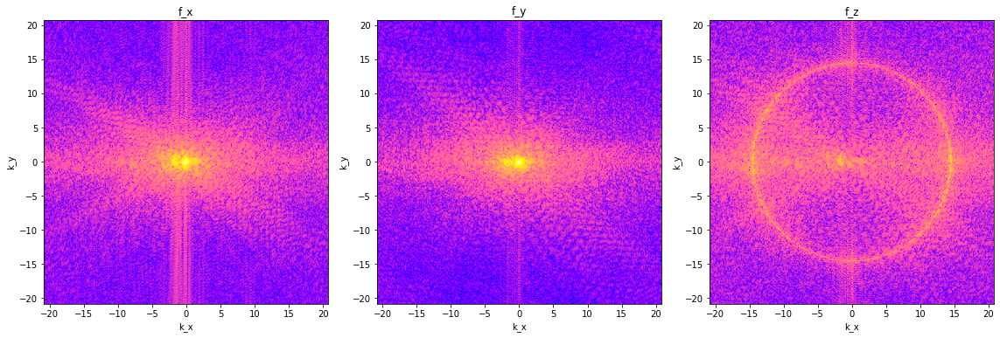

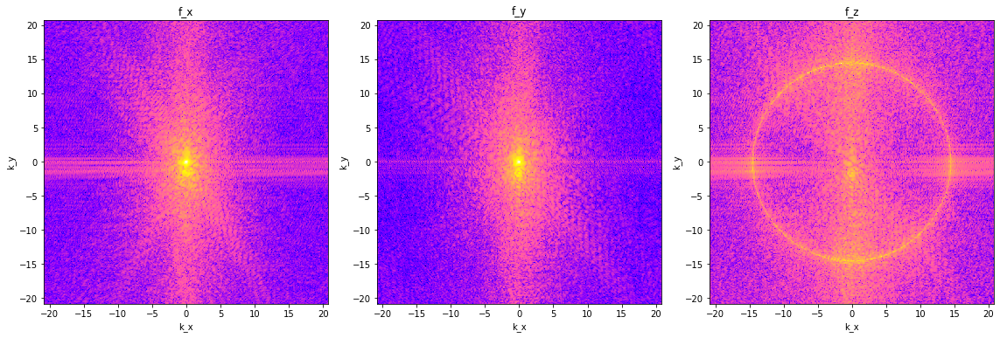

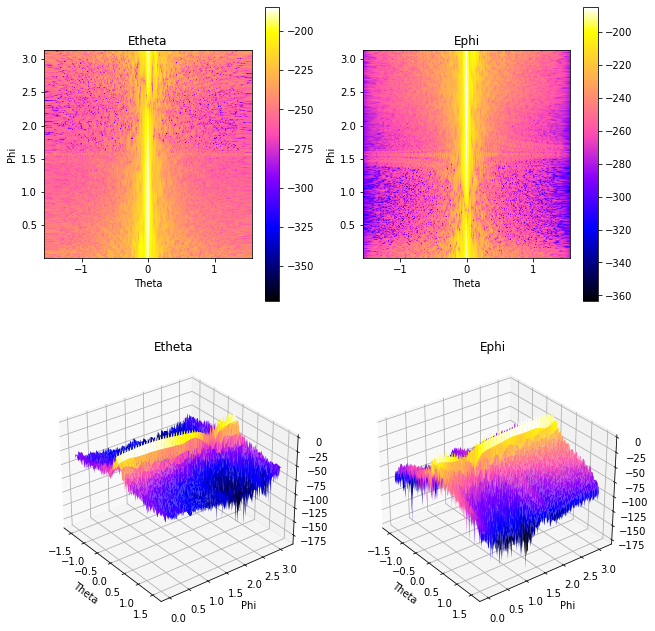

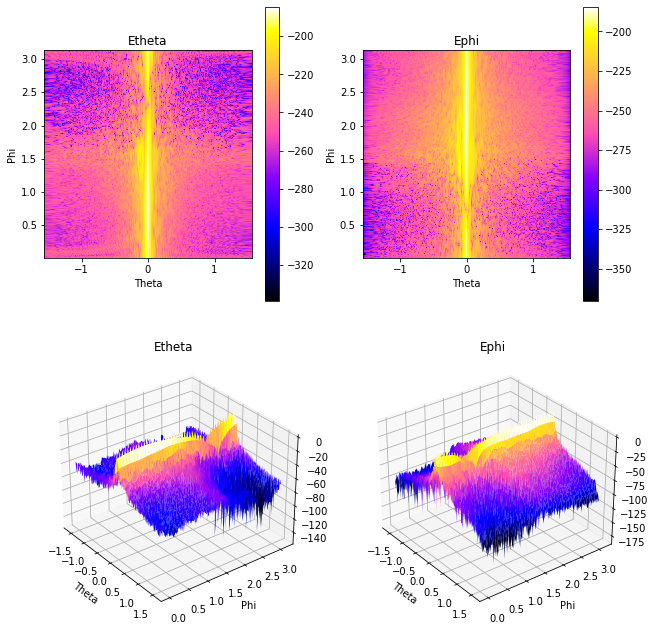

In [65]:
FourierSpace=NFtoFourier(NF_X_Complex,NF_Y_Complex,k_X_Rectangular,k_Y_Rectangular,k0,plotFourier=True)
FourierSpace_flipped = NFtoFourier(NF_X_Complex_flipped,NF_Y_Complex_flipped,k_X_Rectangular,k_Y_Rectangular,k0,plotFourier=True)
plt.savefig('Fourier_Space_flipping_comparison.jpg')

[Etheta,Ephi]=FouriertoFF(FourierSpace[0],FourierSpace[1],FourierSpace[2],theta,phi,k_X_Rectangular,k_Y_Rectangular,k0,FFOutputs=True)
[Etheta_flipped,Ephi_flipped]=FouriertoFF(FourierSpace_flipped[0],FourierSpace_flipped[1],FourierSpace_flipped[2],theta,phi,k_X_Rectangular,k_Y_Rectangular,k0,FFOutputs=True)
plt.savefig('FF_flipping_comparison.jpg')

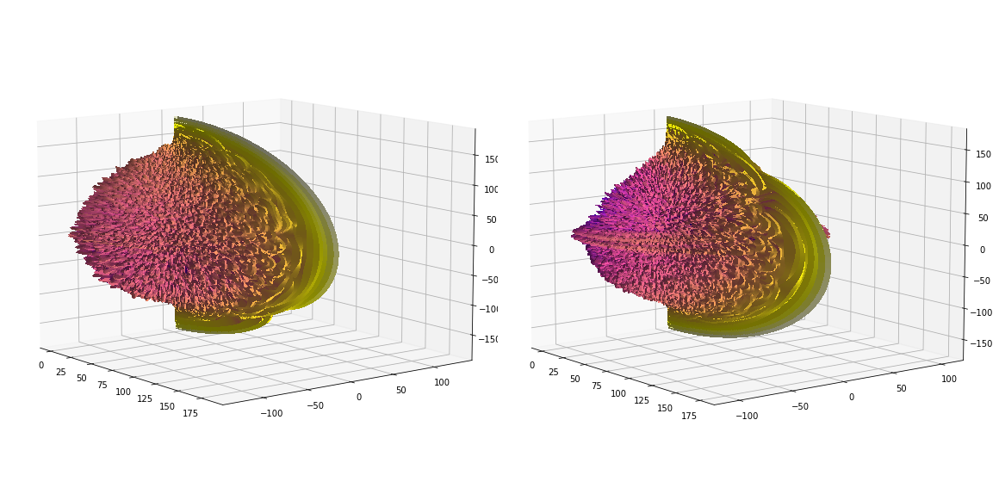

In [66]:
fig=figure(figsize=(16,10))
ax=fig.add_subplot(1,2,1,projection='3d')
R=20.0*np.log10(np.abs(Etheta))-np.nanmin(20.0*np.log10(np.abs(Etheta)))
X=R*np.cos(theta)*np.sin(phi)
Y=R*np.sin(theta)*np.sin(phi)
Z=R*np.cos(phi)
dist = np.sqrt(X**2 + Y**2 + Z**2)
dist_max = np.max(dist)
my_col = cm.gnuplot2(dist/dist_max)
ax.plot_surface(X,Y,Z,rstride=1, cstride=1, facecolors=my_col, linewidth=0, antialiased=False)
ax.view_init(10,-37.5)


ax=fig.add_subplot(1,2,2,projection='3d')
R=20.0*np.log10(np.abs(Ephi))-np.nanmin(20.0*np.log10(np.abs(Ephi)))
X=R*np.cos(theta)*np.sin(phi)
Y=R*np.sin(theta)*np.sin(phi)
Z=R*np.cos(phi)
dist = np.sqrt(X**2 + Y**2 + Z**2)
dist_max = np.max(dist)
my_col = cm.gnuplot2(dist/dist_max)
ax.plot_surface(X,Y,Z,rstride=1, cstride=1, facecolors=my_col, linewidth=0, antialiased=False)
ax.view_init(10,-37.5)
tight_layout()


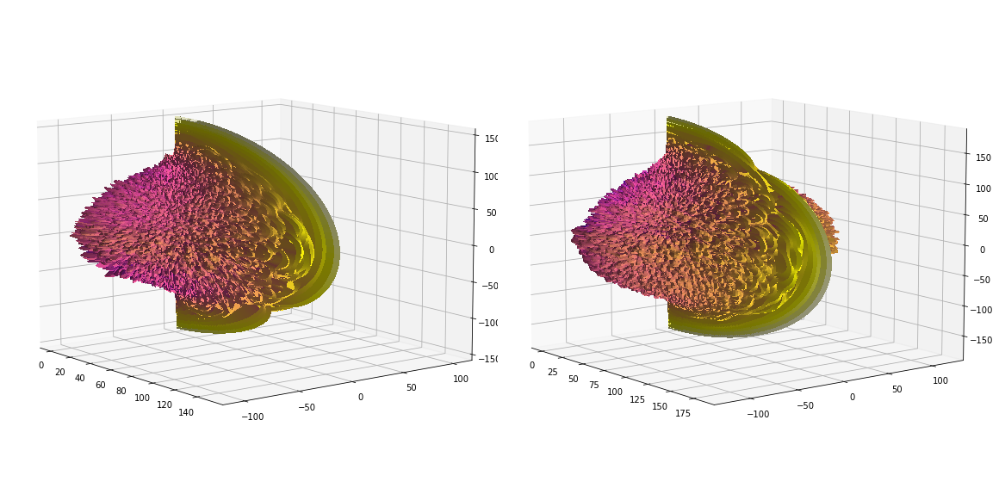

In [67]:
fig=figure(figsize=(16,10))
ax=fig.add_subplot(1,2,1,projection='3d')
R=20.0*np.log10(np.abs(Etheta_flipped))-np.nanmin(20.0*np.log10(np.abs(Etheta_flipped)))
X=R*np.cos(theta)*np.sin(phi)
Y=R*np.sin(theta)*np.sin(phi)
Z=R*np.cos(phi)
dist = np.sqrt(X**2 + Y**2 + Z**2)
dist_max = np.max(dist)
my_col = cm.gnuplot2(dist/dist_max)
ax.plot_surface(X,Y,Z,rstride=1, cstride=1, facecolors=my_col, linewidth=0, antialiased=False)
ax.view_init(10,-37.5)


ax=fig.add_subplot(1,2,2,projection='3d')
R=20.0*np.log10(np.abs(Ephi_flipped))-np.nanmin(20.0*np.log10(np.abs(Ephi_flipped)))
X=R*np.cos(theta)*np.sin(phi)
Y=R*np.sin(theta)*np.sin(phi)
Z=R*np.cos(phi)
dist = np.sqrt(X**2 + Y**2 + Z**2)
dist_max = np.max(dist)
my_col = cm.gnuplot2(dist/dist_max)
ax.plot_surface(X,Y,Z,rstride=1, cstride=1, facecolors=my_col, linewidth=0, antialiased=False)
ax.view_init(10,-37.5)
tight_layout()


## Experiment with 2D Gaussian

In [68]:
# generate grid on which to plot 2D Gaussian

x = range(-50,50,1)
y = range(-50,50,1)
[x_grid,y_grid]=np.meshgrid(x,y)


In [69]:
def Gaussian2D(x_grid,y_grid,A,x0,y0,sigma_x,sigma_y):
    return(A*np.exp(-((x_grid-x0)**2/(2*sigma_x**2)+(y_grid-y0)**2/(2*sigma_y**2))))

<ipython-input-70-d876b24c10ce>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  pcm=ax.pcolormesh(x_grid,y_grid,Gaussiantoplot)


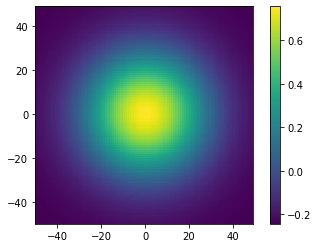

In [70]:
Gaussiantoplot = Gaussian2D(x_grid,y_grid,1,0,0,20,20)
Gaussiantoplot = Gaussiantoplot - np.nanmean(Gaussiantoplot)

fig=plt.figure()
ax=fig.add_subplot(1,1,1)
pcm=ax.pcolormesh(x_grid,y_grid,Gaussiantoplot)
plt.colorbar(mappable=pcm)
ax.set_aspect('equal')

In [71]:
NF_X_Complex = Gaussiantoplot
NF_Y_Complex = Gaussiantoplot

[m,n,k_X_Rectangular,k_Y_Rectangular,theta,phi]=RegularGridding(x,y,0.01,0.01)
k0 = Calculate_k0((EWpol_NF_data['f'])[275]*(10**6))

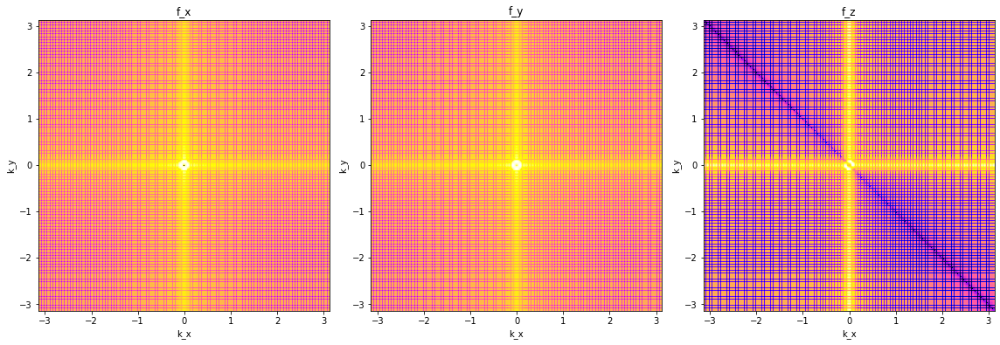

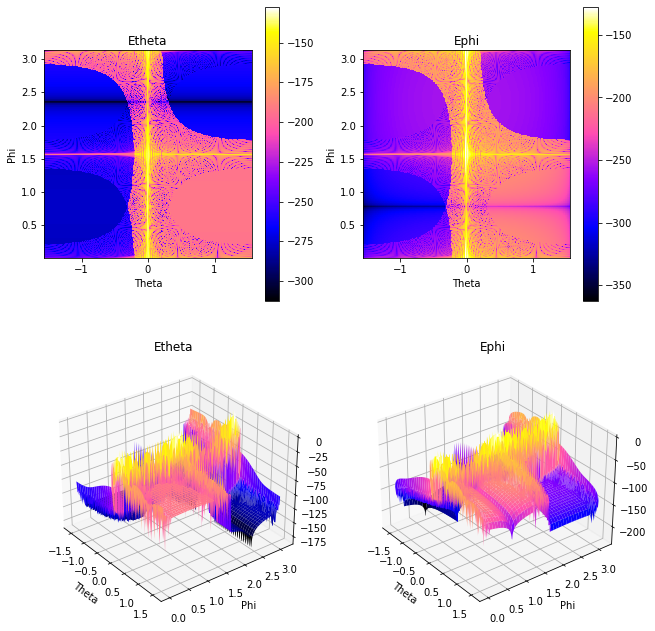

In [72]:
# Running Gaussian through NF to FF transformation

FourierSpace=NFtoFourier(NF_X_Complex,NF_Y_Complex,k_X_Rectangular,k_Y_Rectangular,k0,plotFourier=True)

[Etheta,Ephi]=FouriertoFF(FourierSpace[0],FourierSpace[1],FourierSpace[2],theta,phi,k_X_Rectangular,k_Y_Rectangular,k0,FFOutputs=True)
plt.savefig('Gaussian_NF2FF_outputs.jpg')

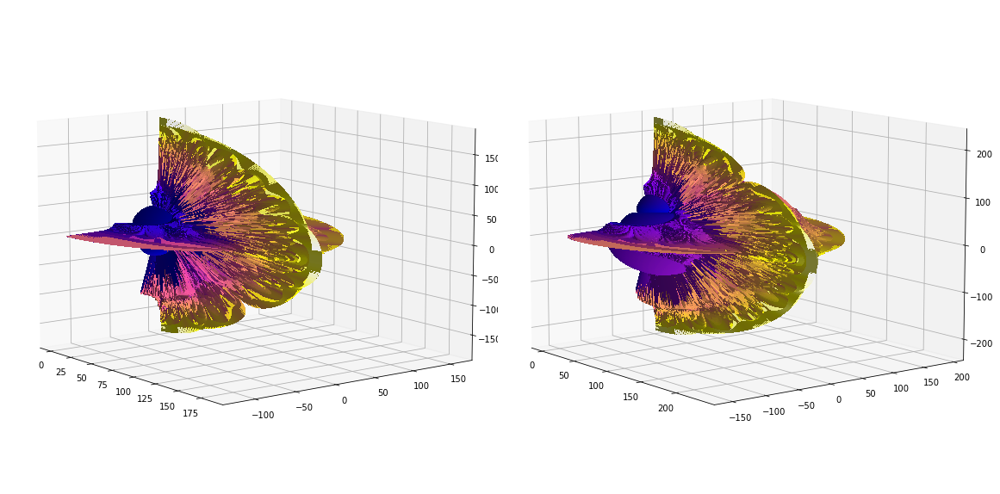

In [73]:
fig=figure(figsize=(16,10))
ax=fig.add_subplot(1,2,1,projection='3d')
R=20.0*np.log10(np.abs(Etheta))-np.nanmin(20.0*np.log10(np.abs(Etheta)))
X=R*np.cos(theta)*np.sin(phi)
Y=R*np.sin(theta)*np.sin(phi)
Z=R*np.cos(phi)
dist = np.sqrt(X**2 + Y**2 + Z**2)
dist_max = np.max(dist)
my_col = cm.gnuplot2(dist/dist_max)
ax.plot_surface(X,Y,Z,rstride=1, cstride=1, facecolors=my_col, linewidth=0, antialiased=False)
ax.view_init(10,-37.5)


ax=fig.add_subplot(1,2,2,projection='3d')
R=20.0*np.log10(np.abs(Ephi))-np.nanmin(20.0*np.log10(np.abs(Ephi)))
X=R*np.cos(theta)*np.sin(phi)
Y=R*np.sin(theta)*np.sin(phi)
Z=R*np.cos(phi)
dist = np.sqrt(X**2 + Y**2 + Z**2)
dist_max = np.max(dist)
my_col = cm.gnuplot2(dist/dist_max)
ax.plot_surface(X,Y,Z,rstride=1, cstride=1, facecolors=my_col, linewidth=0, antialiased=False)
ax.view_init(10,-37.5)
tight_layout()


## Experiment with NF2FF package sample data

In [74]:
broadcast_freq=94*(10**9) # broadcast frequency in hertz
sdata=np.array(pandas.read_csv('sample_data.csv',header=None)).flatten()
sdata=np.array([complex(x.replace('i','j')) for x in sdata]).reshape((51,51,201))
sdata2=np.array(pandas.read_csv('s21_data2.csv',header=None)).flatten()
sdata2=np.array([complex(x.replace('i','j')) for x in sdata2]).reshape((51,51,201))
freq=np.loadtxt('sample_frequencies.csv',delimiter=',') #Hz

M=51#sdata.xpoints; # Amount of samples in the x direction (along table, left to right)
N=51#sdata.ypoints; # Amount of samples in the y direction (across table, front to back)
dx=1/1000#sdata.x_step/1000; # Sample spacing in the x direction [m]
dy=1/1000#sdata.y_step/1000; # Sample spacing in the y direction [m]
# See equations (16-10a) and (16-10b) in Balanis
a=dx*(M-1); # The length of the scanned area in the x direction [m]
b=dy*(N-1); # The length of the scanned area in the y direction [m]
x=np.linspace(-a/2,a/2,M)
y=np.linspace(-b/2,b/2,N)
z0=0.006;

[m,n,k_X_Rectangular,k_Y_Rectangular,theta,phi] = RegularGridding(x,y,0.05,0.05)



In [75]:
# reading NF data into grid
find=200
f=freq[find];print(f*1e-9)
k0 = Calculate_k0(f)
NF_X_Complex=sdata[:,:,find]
NF_Y_Complex=sdata2[:,:,find]
NF_X_Magnitude = (np.abs(NF_X_Complex));
NF_Y_Magnitude = (np.abs(NF_Y_Complex));
from skimage.restoration import unwrap_phase
NF_X_Phase=unwrap_phase(np.angle(NF_X_Complex),wrap_around=True)
NF_Y_Phase=unwrap_phase(np.angle(NF_Y_Complex),wrap_around=True)

110.0


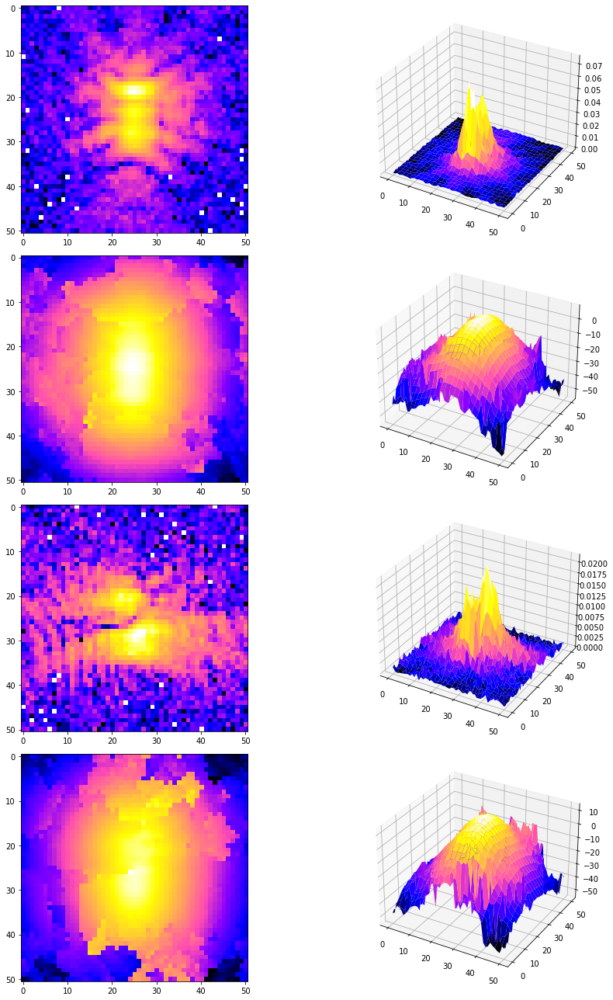

In [76]:
# plotting NF patterns

fig=figure(figsize=(16,18))
ax=fig.add_subplot(4, 2, 1)
ax.imshow(NF_X_Magnitude,aspect='equal',cmap='gnuplot2',norm=LogNorm())
ax=fig.add_subplot(4, 2, 2, projection='3d')
[X,Y]=np.meshgrid(np.arange(51),np.arange(51))
ax.plot_surface(X,Y,NF_X_Magnitude,cmap='gnuplot2',norm=LogNorm())
ax=fig.add_subplot(4, 2, 5)
ax.imshow(NF_Y_Magnitude,aspect='equal',cmap='gnuplot2',norm=LogNorm())
ax=fig.add_subplot(4, 2, 6, projection='3d')
ax.plot_surface(X,Y,NF_Y_Magnitude,cmap='gnuplot2',norm=LogNorm())
tight_layout()

ax=fig.add_subplot(4, 2, 3)
ax.imshow(NF_X_Phase,aspect='equal',cmap='gnuplot2')
ax=fig.add_subplot(4, 2, 4, projection='3d')
[X,Y]=np.meshgrid(np.arange(51),np.arange(51))
ax.plot_surface(X,Y,NF_X_Phase,cmap='gnuplot2')
ax=fig.add_subplot(4, 2, 7)
ax.imshow(NF_Y_Phase,aspect='equal',cmap='gnuplot2')
ax=fig.add_subplot(4, 2, 8, projection='3d')
ax.plot_surface(X,Y,NF_Y_Phase,cmap='gnuplot2')
tight_layout()

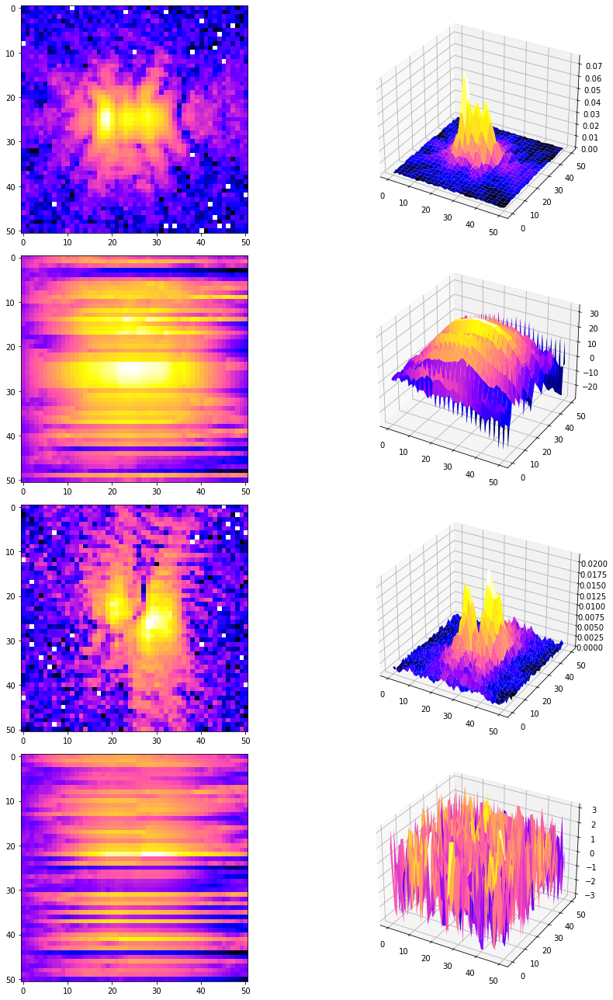

In [77]:
# transposing the near-field pattern

NF_X_flipped = np.transpose(NF_X_Complex)
NF_Y_flipped = np.transpose(NF_Y_Complex)

fig=figure(figsize=(16,18))
ax=fig.add_subplot(4, 2, 1)
ax.imshow(np.abs(NF_X_flipped),aspect='equal',cmap='gnuplot2',norm=LogNorm())
ax=fig.add_subplot(4, 2, 2, projection='3d')
[X,Y]=np.meshgrid(np.arange(51),np.arange(51))
ax.plot_surface(X,Y,np.abs(NF_X_flipped),cmap='gnuplot2',norm=LogNorm())
ax=fig.add_subplot(4, 2, 5)
ax.imshow(np.abs(NF_Y_flipped),aspect='equal',cmap='gnuplot2',norm=LogNorm())
ax=fig.add_subplot(4, 2, 6, projection='3d')
ax.plot_surface(X,Y,np.abs(NF_Y_flipped),cmap='gnuplot2',norm=LogNorm())
tight_layout()

ax=fig.add_subplot(4, 2, 3)
ax.imshow(np.unwrap(np.angle(NF_X_flipped)),aspect='equal',cmap='gnuplot2')
ax=fig.add_subplot(4, 2, 4, projection='3d')
[X,Y]=np.meshgrid(np.arange(51),np.arange(51))
ax.plot_surface(X,Y,np.unwrap(np.angle(NF_X_flipped)),cmap='gnuplot2')
ax=fig.add_subplot(4, 2, 7)
ax.imshow(np.unwrap(np.angle(NF_Y_flipped)),aspect='equal',cmap='gnuplot2')
ax=fig.add_subplot(4, 2, 8, projection='3d')
ax.plot_surface(X,Y,np.angle(NF_Y_flipped),cmap='gnuplot2')
tight_layout()

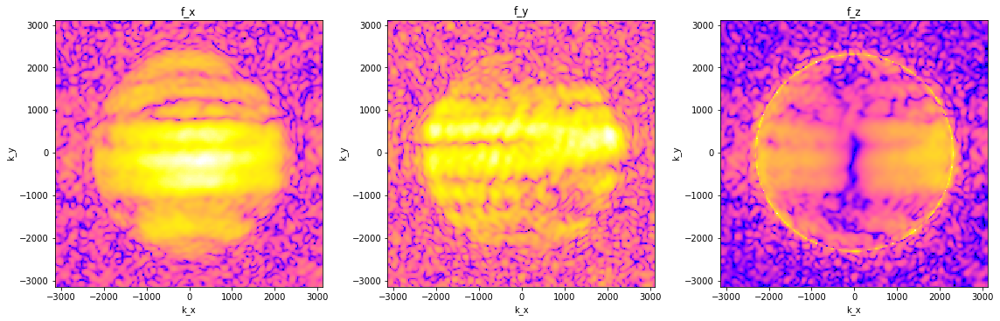

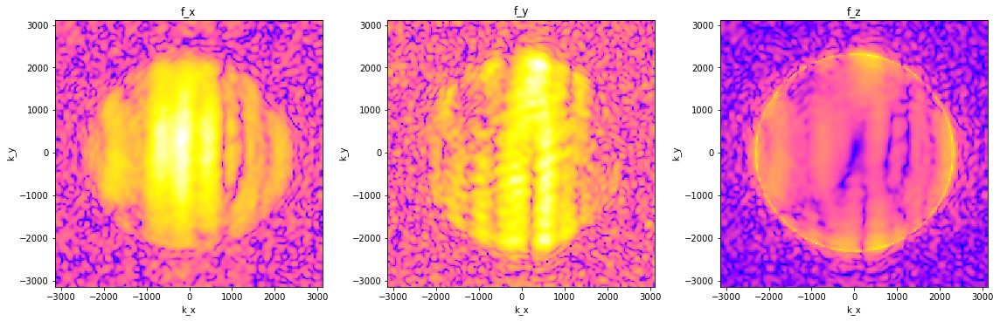

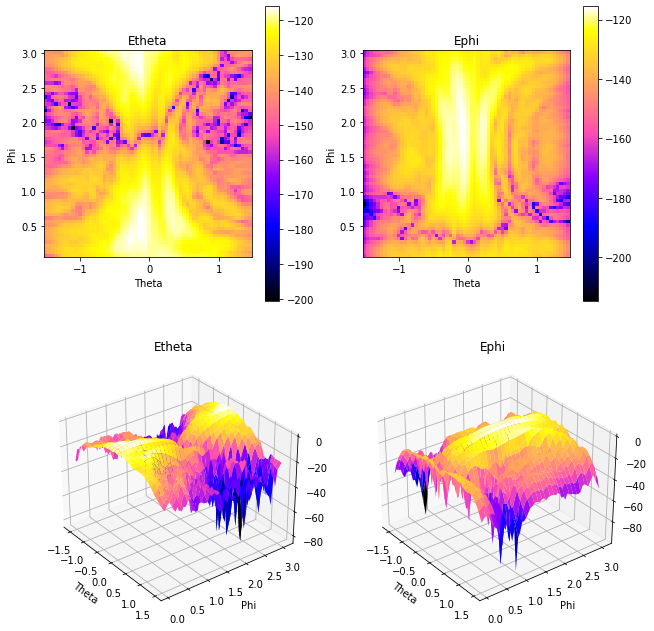

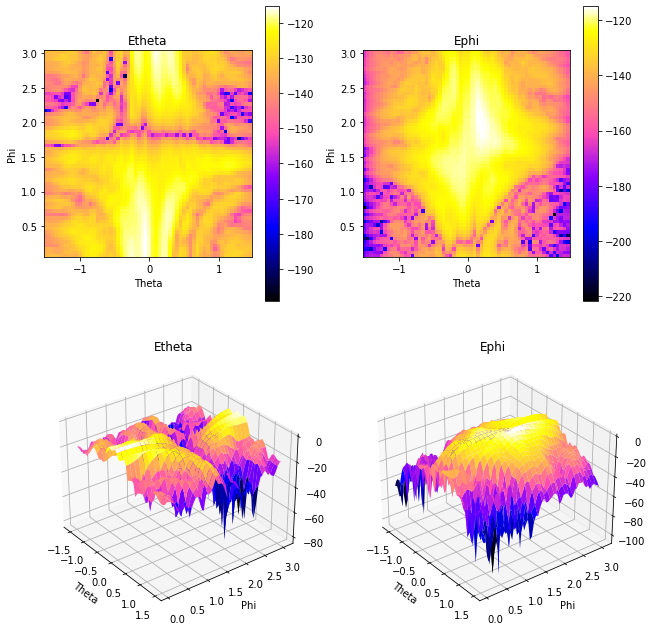

In [78]:
FourierSpace=NFtoFourier(NF_X_Complex,NF_Y_Complex,k_X_Rectangular,k_Y_Rectangular,k0,plotFourier=True)
FourierSpace_flipped = NFtoFourier(NF_X_flipped,NF_Y_flipped,k_X_Rectangular,k_Y_Rectangular,k0,plotFourier=True)

[Etheta,Ephi]=FouriertoFF(FourierSpace[0],FourierSpace[1],FourierSpace[2],theta,phi,k_X_Rectangular,k_Y_Rectangular,k0,FFOutputs=True)
[Etheta_flipped,Ephi_flipped]=FouriertoFF(FourierSpace_flipped[0],FourierSpace_flipped[1],FourierSpace_flipped[2],theta,phi,k_X_Rectangular,k_Y_Rectangular,k0,FFOutputs=True)